In [301]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
from scipy.stats import f_oneway, chi2_contingency, pearsonr
from datetime import datetime

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [302]:
import plotly.io as pio

pio.renderers.default = 'notebook'

In [303]:
filename = 'output.json'
with open(filename, 'r', encoding = 'utf-8') as file:
    df = pd.DataFrame.from_dict(json.load(file), orient = 'index')

df.head()

,title,platforms,rating,votes,developer,release_date,price,genres
https://store.playstation.com/en-us/concept/10001130,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS5, PS4]",4.04,334075,Activision,11/2/2023,45.49,[Action]
https://store.playstation.com/en-us/concept/228748,Fortnite,[PS5],4.32,6876621,Epic Games,7/21/2017,0.0,"[Action, Adventure]"
https://store.playstation.com/en-us/concept/10007788,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS5, PS4]",3.01,33433,2K,9/8/2023,10.49,[Sport]
https://store.playstation.com/en-us/concept/221852,Destiny 2 PS4™ & PS5™,"[PS5, PS4]",4.28,292806,Bungie,12/8/2020,0.0,"[Shooter, Adventure, Action]"
https://store.playstation.com/en-us/concept/10007176,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS5, PS4]",3.25,87378,Electronic Arts Inc,9/29/2023,69.99,[Sport]


## Начнём очищать данные

### Удалим все пустые значения

In [304]:
df['url'] = df.index
df = df.reset_index(drop = True)
df.head()

,title,platforms,rating,votes,developer,release_date,price,genres,url
0,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS5, PS4]",4.04,334075,Activision,11/2/2023,45.49,[Action],https://store.playstation.com/en-us/concept/10...
1,Fortnite,[PS5],4.32,6876621,Epic Games,7/21/2017,0.0,"[Action, Adventure]",https://store.playstation.com/en-us/concept/22...
2,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS5, PS4]",3.01,33433,2K,9/8/2023,10.49,[Sport],https://store.playstation.com/en-us/concept/10...
3,Destiny 2 PS4™ & PS5™,"[PS5, PS4]",4.28,292806,Bungie,12/8/2020,0.0,"[Shooter, Adventure, Action]",https://store.playstation.com/en-us/concept/22...
4,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS5, PS4]",3.25,87378,Electronic Arts Inc,9/29/2023,69.99,[Sport],https://store.playstation.com/en-us/concept/10...


In [305]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9033 entries, 0 to 9032
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   title         9033 non-null   object 
 1   platforms     9033 non-null   object 
 2   rating        9033 non-null   float64
 3   votes         9033 non-null   int64  
 4   developer     9033 non-null   object 
 5   release_date  9033 non-null   object 
 6   price         9033 non-null   object 
 7   genres        9033 non-null   object 
 8   url           9033 non-null   object 
dtypes: float64(1), int64(1), object(7)
memory usage: 635.3+ KB


In [306]:
for column in df.columns:
    display(df[column].value_counts())
    print()

title
Title Not Found                 4
MediEvil                        2
Angry Birds VR: Isle of Pigs    2
Happy Drummer                   2
Brain Beats                     2
                               ..
Crazy Chicken Kart 2            1
River City: Rival Showdown      1
Battle Garegga Rev.2016         1
Livelock                        1
Throne Quest Deluxe             1
Name: count, Length: 9016, dtype: int64

platforms
[PS4]                                      5596
[PS5, PS4]                                 2795
[PS5]                                       618
[]                                            6
[PS5, PS5 Edition, PS4]                       4
[PS5, Standard Edition PS4 & PS5, PS4]        2
[PS5, Slayer Edition PS5, PS4]                1
[PS5, PS4 + PS5, PS4]                         1
[PS5, PS4 + PS5 + Avatars, PS4]               1
[BAD DREAMS - PSVR Edition, PS4]              1
[PS5, Umurangi Generation PS5+VR2, PS4]       1
[PS5, Standard Edition PS5, PS4]              1
[PS5, PS4, Standard Edition (PS5)]            1
[PS5, TRIPP (PS5)]                            1
[PS5, GRID Legends (PS5), PS4]                1
[Standard Edition PS5 & PS4, PS5, PS4]        1
[PS5, PS4, Warframe (PS5)]                    1
[PS5, PSVR2 Edition]                          1
Name: count, dtype: int64

rating
4.00    174
4.50    103
5.00    101
4.33     89
4.40     87
       ... 
1.46      1
1.63      1
1.98      1
1.74      1
2.05      1
Name: count, Length: 341, dtype: int64

votes
13       100
9         96
6         90
14        87
11        87
        ... 
6178       1
14391      1
13427      1
11542      1
60389      1
Name: count, Length: 2467, dtype: int64

developer
HAMSTER Corporation                          374
Ratalaika Games SL                           262
EastAsiaSoft                                 205
Sony Interactive Entertainment               172
Webnetic s. r. o.                            111
                                            ... 
YOGSCAST LTD                                   1
COOKING AND PUBLISHING, SOCIEDAD LIMITADA      1
Humble Hearts LLC                              1
Visai Games Inc.                               1
Glass Knuckle Games                            1
Name: count, Length: 1745, dtype: int64

release_date
2/22/2023     45
11/12/2020    34
5/16/2024     24
5/29/2018     22
11/2/2023     20
              ..
4/14/2024      1
9/6/2021       1
11/22/2021     1
2/12/2022      1
1/13/2017      1
Name: count, Length: 2042, dtype: int64

price
19.99    1171
9.99      951
14.99     947
4.99      738
7.99      581
         ... 
13.39       1
7.14        1
25.49       1
8.24        1
23.49       1
Name: count, Length: 165, dtype: int64

genres
[Action]                           879
[Adventure]                        657
[]                                 423
[Role Playing Games]               345
[Shooter]                          270
                                  ... 
[Educational, Simulation]            1
[Adventure, Party, Unique]           1
[Party, Puzzle, Party]               1
[Arcade, Driving/Racing, Party]      1
[Action, Puzzle, Casual]             1
Name: count, Length: 940, dtype: int64

url
https://store.playstation.com/en-us/concept/10001130    1
https://store.playstation.com/en-us/concept/230638      1
https://store.playstation.com/en-us/concept/10005428    1
https://store.playstation.com/en-us/concept/10003787    1
https://store.playstation.com/en-us/concept/10004200    1
                                                       ..
https://store.playstation.com/en-us/concept/10001307    1
https://store.playstation.com/en-us/concept/10003524    1
https://store.playstation.com/en-us/concept/10010831    1
https://store.playstation.com/en-us/concept/10009487    1
https://store.playstation.com/en-us/concept/234706      1
Name: count, Length: 9033, dtype: int64

Мы можем заметить, что для столбца votes есть игры, у которых количество голосов равно 0. Посмотрев на них подробнее мы можем заметить, что это те игры, которые выйдут в будущем. Мы их сохраним для будущего анализа в отдельный датафрейм и удалим из текущего.

### Удаление дубликатов

In [307]:
filtered_df = df[df.index != "Title Not Found"]

duplicated_titles = filtered_df.index.duplicated(keep = False)
duplicates = filtered_df.loc[duplicated_titles]

duplicates_dict = {}

for idx, row in duplicates.iterrows():
    if idx not in duplicates_dict:
        duplicates_dict[idx] = [row['url']]
    else:
        duplicates_dict[idx].append(row['url'])

duplicates_dict = sorted(duplicates_dict.items(), key = lambda x: x[0])

for key, value in duplicates_dict:
    print(f'Дубликат: {key} по ссылкам {" и ".join(value)}')

print(f'\nВсего дубликатов: {len(duplicates_dict)}')


Всего дубликатов: 0


### Теперь мы удалим те игры, данные у которых не найдены

In [308]:
df = df[df['title'] != "Title Not Found"]
df = df[df['developer'] != "Developer Not Found"]
df = df[df['rating'] != "Rating Not Found"]
df = df[df['votes'] != "Votes Not Found"]
df = df[df['price'] != "Price Not Found"]
df = df[df['release_date'] != "Release Date Not Found"]

### Проверка на то, какие типы у нас в df

In [309]:
df['rating'] = df['rating'].astype(float)
df['votes'] = df['votes'].astype(int)
df['developer'] = df['developer'].astype(str)
df['release_date'] = pd.to_datetime(df['release_date'])
df['price'] = df['price'].astype(float)
df['url'] = df['url'].astype(str)

print(df.dtypes)

title                   object
platforms               object
rating                 float64
votes                    int64
developer               object
release_date    datetime64[ns]
price                  float64
genres                  object
url                     object
dtype: object


### Изменение игр на более точную информацию по ним 

In [310]:
def map_platform(platform):
    platform = [i.lower() for i in platform]
    if 'ps4' in platform and 'ps5' in platform:
        return ['PS4', 'PS5']
    elif 'ps4' in platform:
        return ['PS4']
    elif 'ps5' in platform:
        return ['PS5']
    return platform


df['platforms'] = df['platforms'].apply(map_platform)

### Очищение разработчиков, чтобы не было нечитаемых символов (например, иероглифов)

In [311]:
pattern = r'^[\w \&\'\-éèáäëíóöñüç®™]+$'

filtered_df = df[df['developer'].str.match(pattern)]

print(len(filtered_df) / len(df) * 100)

70.853212027072


### Удаление будущий игр и сохранение их в новый файл

In [312]:
future_games_df = df[df['votes'] == 0]

future_games_df.to_csv('future_games.csv', index = False)

df = df[df['votes'] != 0]
df.reset_index(drop = True, inplace = True)

df.to_csv('games.csv', index = False)

df

,title,platforms,rating,votes,developer,release_date,price,genres,url
0,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS4, PS5]",4.04,334075,Activision,2023-11-02,45.49,[Action],https://store.playstation.com/en-us/concept/10...
1,Fortnite,[PS5],4.32,6876621,Epic Games,2017-07-21,0.00,"[Action, Adventure]",https://store.playstation.com/en-us/concept/22...
2,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS4, PS5]",3.01,33433,2K,2023-09-08,10.49,[Sport],https://store.playstation.com/en-us/concept/10...
3,Destiny 2 PS4™ & PS5™,"[PS4, PS5]",4.28,292806,Bungie,2020-12-08,0.00,"[Shooter, Adventure, Action]",https://store.playstation.com/en-us/concept/22...
4,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS4, PS5]",3.25,87378,Electronic Arts Inc,2023-09-29,69.99,[Sport],https://store.playstation.com/en-us/concept/10...
...,...,...,...,...,...,...,...,...,...
8976,This Way Madness Lies Full Game,[PS5],3.50,6,Zeboyd Digital Entertainment LLC,2023-09-12,9.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...
8977,Threaded,[PS5],3.00,6,OCEAN MEDIA LLC,2023-11-02,9.99,[Puzzle],https://store.playstation.com/en-us/concept/10...
8978,Three Fourths Home: Extended Edition,[PS4],3.70,818,Digerati Distribution,2015-10-13,9.99,"[Adventure, Adventure]",https://store.playstation.com/en-us/concept/20...
8979,Three Minutes To Eight,"[PS4, PS5]",4.00,16,ASSEMBLE ENTERTAINMENT GMBH,2023-12-21,14.99,[Adventure],https://store.playstation.com/en-us/concept/10...


# Графики

## После проделанной работы мы можем начать анализировать данные

In [313]:
df.head()

,title,platforms,rating,votes,developer,release_date,price,genres,url
0,Call of Duty®: Modern Warfare® III - Cross-Gen...,"[PS4, PS5]",4.04,334075,Activision,2023-11-02,45.49,[Action],https://store.playstation.com/en-us/concept/10...
1,Fortnite,[PS5],4.32,6876621,Epic Games,2017-07-21,0.00,"[Action, Adventure]",https://store.playstation.com/en-us/concept/22...
2,NBA 2K24 Kobe Bryant Edition for PS5™,"[PS4, PS5]",3.01,33433,2K,2023-09-08,10.49,[Sport],https://store.playstation.com/en-us/concept/10...
3,Destiny 2 PS4™ & PS5™,"[PS4, PS5]",4.28,292806,Bungie,2020-12-08,0.00,"[Shooter, Adventure, Action]",https://store.playstation.com/en-us/concept/22...
4,EA SPORTS FC™ 24 Standard Edition PS4 & PS5,"[PS4, PS5]",3.25,87378,Electronic Arts Inc,2023-09-29,69.99,[Sport],https://store.playstation.com/en-us/concept/10...


У нас есть данные:

 - title – название игры. Данные в формате – строка
 - platforms – платформы, на которых доступна игра. Данные в формате – список строк
 - rating – рейтинг игры. Данные в формате – вещественное число
 - votes – количество голосов. Данные в формате – целое число
 - developer – разработчик игры. Данные в формате – строка
 - release_date – дата выхода игры. Данные в формате – дата
 - price – цена игры в $. Данные в формате – вещественное число
 - genres – жанры игры. Данные в формате – список строк
 - url – ссылка на игру. Данные в формате – строка

Рассмотрим следующие зависимости:
    
- Распределение рейтинга
- Распределение количества голосов
- Распределение цен
- Распределение даты выхода игр по месяцам
- Распределение жанров
- Распределение платформ
- Распределение игр по разработчикам
- Распределение дохода по разработчикам
- Зависимость рейтинга от количества голосов
- Зависимость рейтинга от цены
- Зависимость рейтинга от даты выхода игры
- Зависимость рейтинга от жанра
- Зависимость рейтинга от платформы
- Зависимость рейтинга от разработчика
- Зависимость количества голосов от цены
- Зависимость количества голосов от даты выхода игры
- Зависимость количества голосов от жанра
- Зависимость количества голосов от платформы
- Зависимость цены от даты выхода игры
- Зависимость цены от жанра
- Зависимость цены от платформы
- Зависимость цены от разработчика
- Зависимость даты выхода игры от жанра
- Зависимость даты выхода игры от платформы
- Зависимость жанра от платформы

## Распределение каждого столбца

### Посмотрим на распределение рейтинга

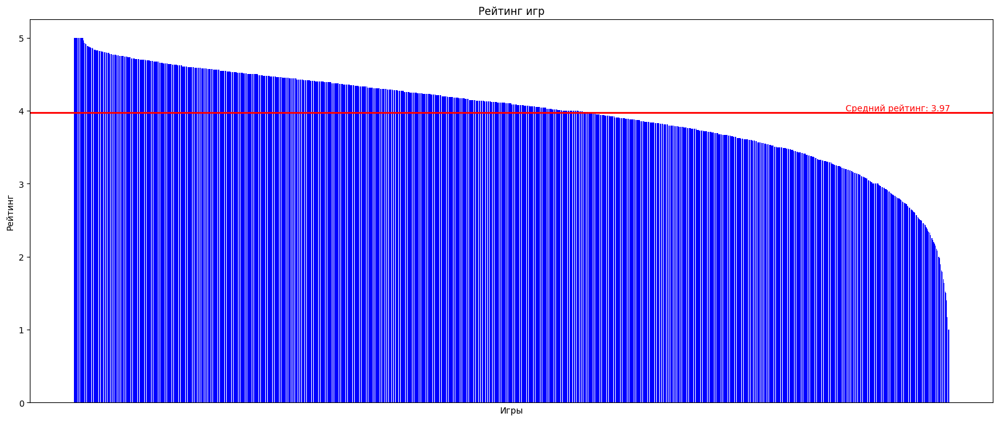

In [314]:
df = df.sort_values('rating', ascending = False)

plt.figure(figsize = (20, 8))
bars = plt.bar(df['title'], df['rating'], color = 'blue')

mean_rating = df['rating'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(df.index) - 1, mean_rating, f'Средний рейтинг: {mean_rating:.2f}', color = 'red',
         va = 'bottom', ha = 'right')

plt.title('Рейтинг игр')
plt.xlabel('Игры')
plt.ylabel('Рейтинг')

plt.xticks([])

plt.show()

### Посмотрим на распределение количества голосов

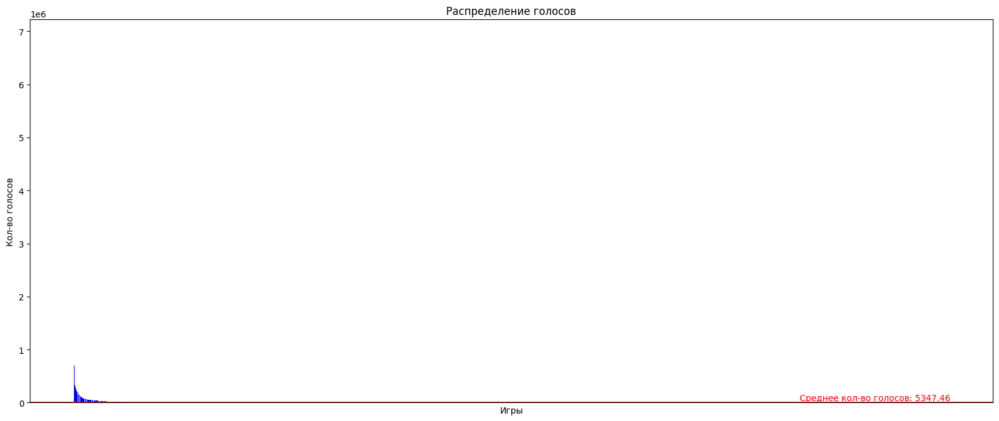

In [315]:
df = df.sort_values('votes', ascending = False)

plt.figure(figsize = (20, 8))
bars = plt.bar(df['title'], df['votes'], color = 'blue')

mean_rating = df['votes'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(df.index) - 1, mean_rating, f'Среднее кол-во голосов: {mean_rating:.2f}',
         color = 'red',
         va = 'bottom', ha = 'right')

plt.title('Распределение голосов')
plt.xlabel('Игры')
plt.ylabel('Кол-во голосов')

plt.xticks([])

plt.show()

Мы можем заметить, что есть игры, у которых количество голосов сильно выше, чем у остальных. Посмотрим на них подробнее.


In [316]:
filter_currency = 100000

In [317]:
filtered_df = df[df['votes'] > filter_currency]['title']

print(
    f"Мы можем заметить, что у игр {', '.join(filtered_df)} кол-во голосов сильно выше, чем у остальных игр")

Мы можем заметить, что у игр Fortnite, Minecraft, Call of Duty®: Modern Warfare®, Rocket League®, Apex Legends™ PS5™, Grand Theft Auto Online (PlayStation®5), Warframe®, The Last Of Us™ Remastered, Blacklight: Retribution, Call of Duty®: Black Ops III - Zombies Chronicles Edition, DC Universe Online Free to Play, War Thunder, Genshin Impact, Call of Duty®: Modern Warfare® III - Cross-Gen Bundle, Fall Guys, Roblox, eFootball™ 2024, Destiny 2 PS4™ & PS5™, Call of Duty®: Infinite Warfare, World of Tanks Modern Armor, Destiny - The Collection, Brawlhalla, Tom Clancy's Rainbow Six® Siege Deluxe Edition, The Crew® 2, Red Dead Redemption 2, Bloodborne™, Paladins, DRAGON BALL XENOVERSE 2, God of War, Battlefield 4™, The Witcher 3: Wild Hunt – Complete Edition, Call of Duty®: Black Ops Cold War - Cross-Gen Bundle PS4® & PS5®, H1Z1: Battle Royale, Marvel's Spider-Man Remastered, Rec Room, Overwatch 2 – Season 10: Venture Forth, ARK: Survival Evolved, Trove, Warface: Clutch, LittleBigPlanet™ 3, U

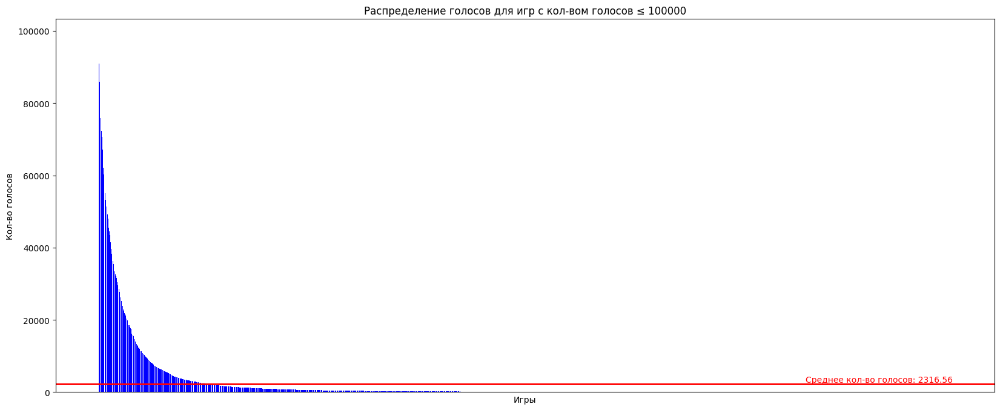

In [318]:
filtered_df = df[df['votes'] <= filter_currency]

plt.figure(figsize = (20, 8))
bars = plt.bar(filtered_df['title'], filtered_df['votes'], color = 'blue')

mean_rating = filtered_df['votes'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(filtered_df.index) - 1, mean_rating, f'Среднее кол-во голосов: {mean_rating:.2f}',
         color = 'red',
         va = 'bottom', ha = 'right')

plt.title(f'Распределение голосов для игр с кол-вом голосов ≤ {filter_currency}')
plt.xlabel('Игры')
plt.ylabel('Кол-во голосов')

plt.xticks([])

plt.show()

### Посмотрим на распределение цен

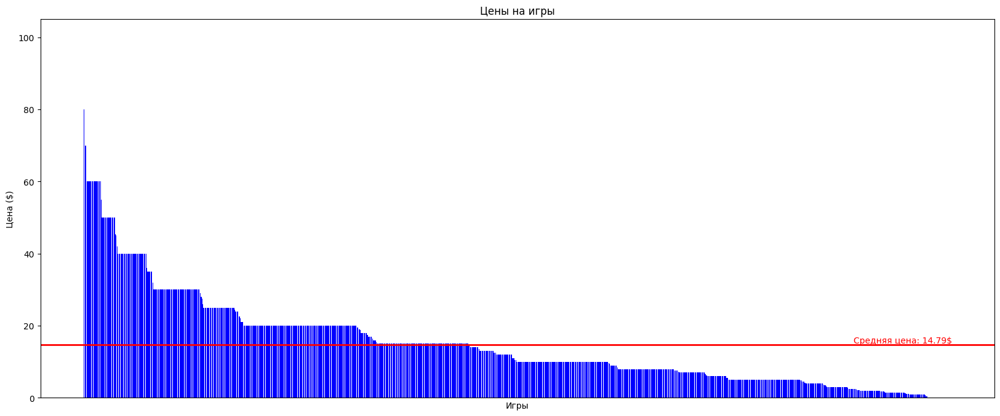

In [319]:
df = df.sort_values('price', ascending = False)

plt.figure(figsize = (20, 8))
bars = plt.bar(df['title'], df['price'], color = 'blue')

mean_rating = df['price'].mean()
plt.axhline(y = mean_rating, color = 'r', linestyle = '-', linewidth = 2)
plt.text(len(df.index) - 1, mean_rating, f'Средняя цена: {mean_rating:.2f}$', color = 'red',
         va = 'bottom', ha = 'right')

plt.title('Цены на игры')
plt.xlabel('Игры')
plt.ylabel('Цена ($)')

plt.xticks([])

plt.show()

### Посмотрим на распределение даты выхода игр по месяцам

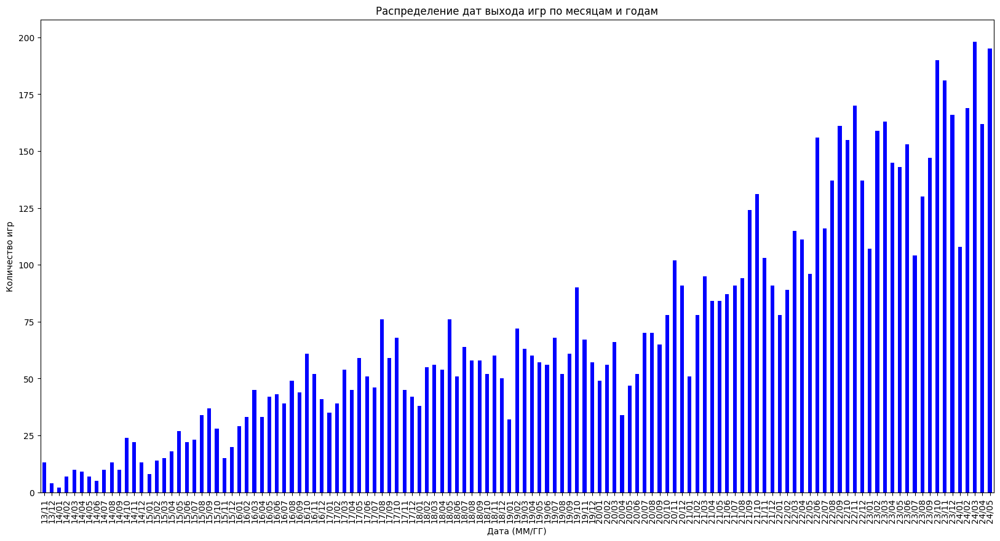

In [320]:
df['month_year'] = df['release_date'].dt.strftime('%y/%m')
monthly_yearly_releases = df['month_year'].value_counts().sort_index()

plt.figure(figsize = (20, 10))
monthly_yearly_releases.plot(kind = 'bar', color = 'blue')
plt.title('Распределение дат выхода игр по месяцам и годам')
plt.xlabel('Дата (ММ/ГГ)')
plt.ylabel('Количество игр')
plt.xticks(rotation = 90)
plt.show()

### Посмотрим на распределение жанров

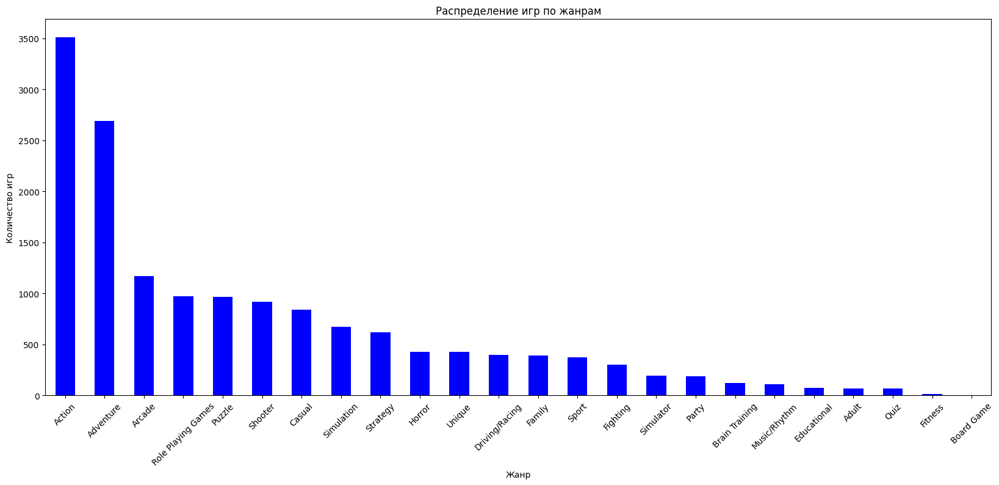

In [321]:
genres_expanded = df.explode('genres')

genre_counts = genres_expanded['genres'].value_counts()

plt.figure(figsize = (20, 8))
genre_counts.plot(kind = 'bar', color = 'blue')
plt.title('Распределение игр по жанрам')
plt.xlabel('Жанр')
plt.ylabel('Количество игр')
plt.xticks(rotation = 45)
plt.show()

### Посмотрим на распределение платформ

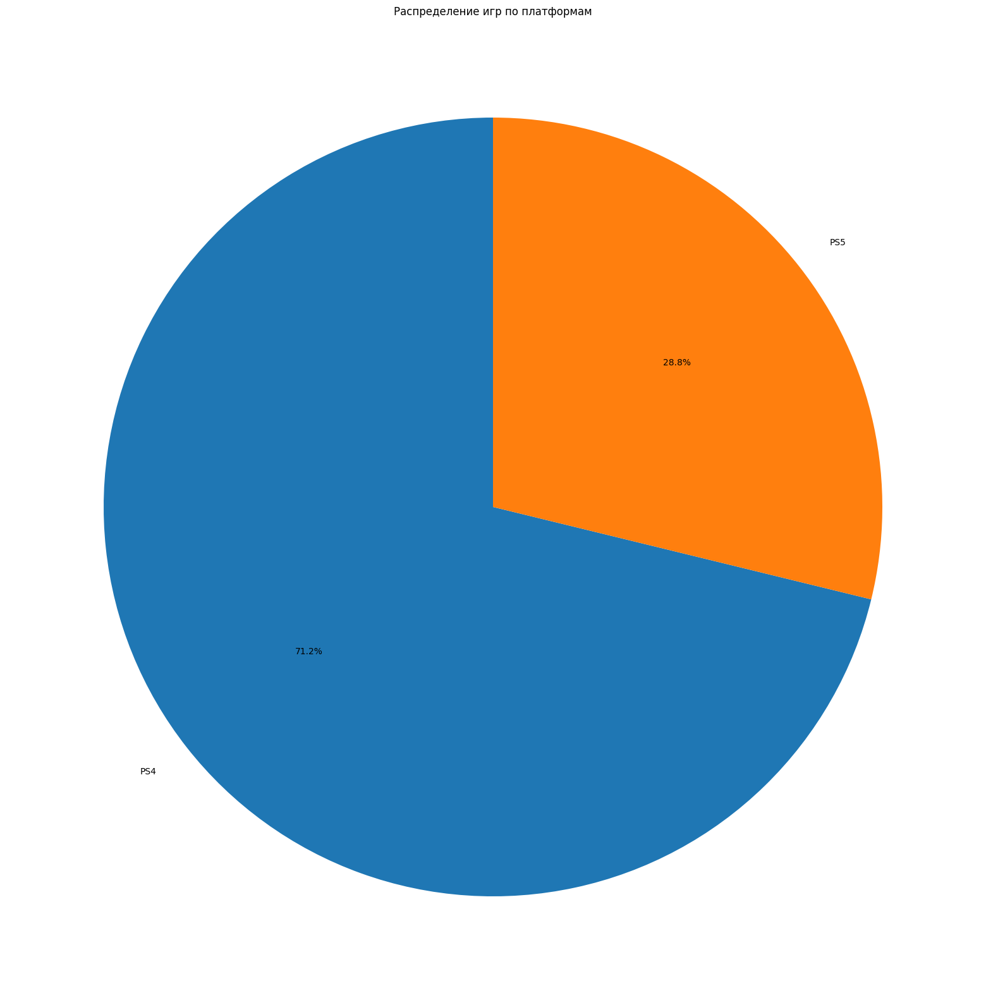

In [322]:
platform_expanded = df.explode('platforms')

platform_counts = platform_expanded['platforms'].value_counts()

plt.figure(figsize = (20, 20))
plt.pie(platform_counts, labels = platform_counts.index, autopct = '%1.1f%%', startangle = 90)
plt.title('Распределение игр по платформам')
plt.show()

### Посмотрим на распределение разработчиков

In [323]:
developers_percent = 0.008

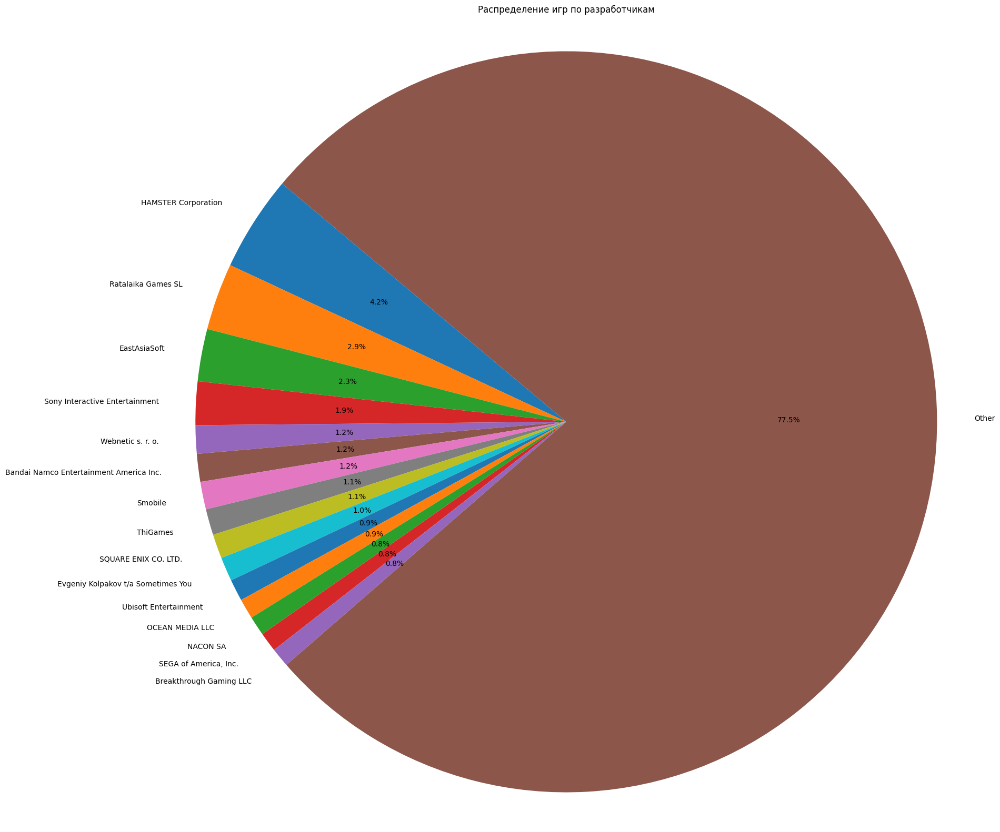

In [324]:
developer_counts = df['developer'].value_counts()

developer_counts_df = developer_counts.reset_index()
developer_counts_df.columns = ['developer', 'count']

total_games = developer_counts_df['count'].sum()
threshold = developers_percent * total_games

developer_counts_df['developer'] = developer_counts_df.apply(
    lambda x: 'Other' if x['count'] < threshold else x['developer'], axis = 1)

final_counts = developer_counts_df.groupby('developer')['count'].sum()

final_counts = final_counts.drop('Other', errors = 'ignore')
final_counts = final_counts.sort_values(ascending = False)
final_counts['Other'] = developer_counts_df.loc[
    developer_counts_df['developer'] == 'Other', 'count'].sum()

plt.figure(figsize = (20, 20))
pie = plt.pie(final_counts, labels = final_counts.index, autopct = '%1.1f%%', startangle = 140)
plt.title('Распределение игр по разработчикам')

plt.axis('equal')
plt.show()

### Посмотрим на распределение дохода по разработчикам

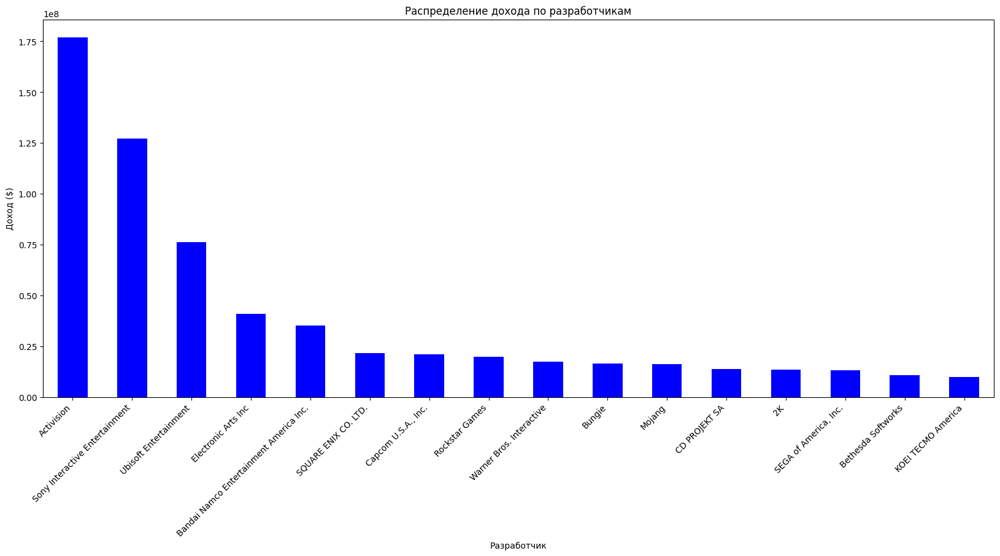

In [325]:
df['revenue'] = df['price'] * df['votes']

developer_revenue = df.groupby('developer')['revenue'].sum()

developer_revenue_df = developer_revenue.reset_index()
developer_revenue_df.columns = ['developer', 'revenue']

total_revenue = developer_revenue_df['revenue'].sum()

threshold = developers_percent * total_revenue

developer_revenue_df['developer'] = developer_revenue_df.apply(
    lambda x: 'Other' if x['revenue'] < threshold else x['developer'], axis = 1)

final_revenue = developer_revenue_df.groupby('developer')['revenue'].sum()

final_revenue = final_revenue.drop('Other', errors = 'ignore')

final_revenue = final_revenue[final_revenue / total_revenue > developers_percent]
final_revenue.sort_values(ascending = False).plot(kind = 'bar', figsize = (20, 8),
                                                  color = 'blue')
plt.title('Распределение дохода по разработчикам')
plt.xlabel('Разработчик')
plt.ylabel('Доход ($)')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

## Зависимости рейтинга от других переменных

### Зависимость рейтинга от количества голосов

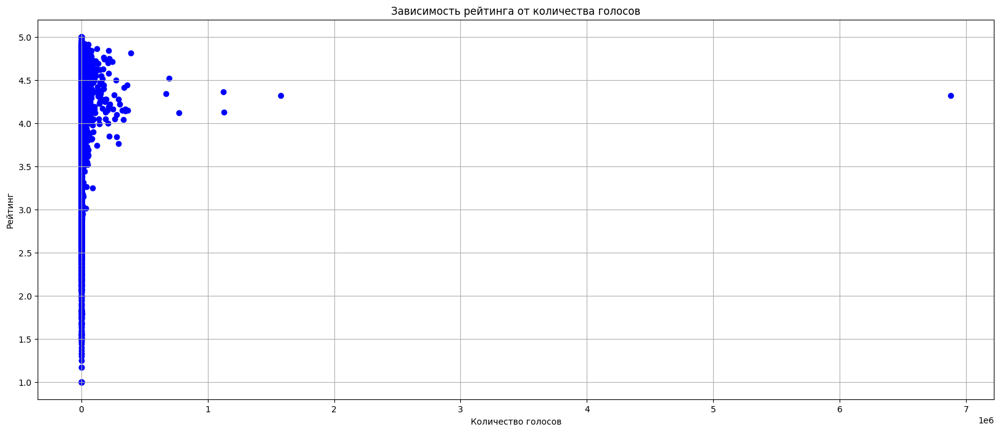

In [326]:
plt.figure(figsize = (20, 8))
plt.scatter(df['votes'], df['rating'], color = 'blue')
plt.title('Зависимость рейтинга от количества голосов')
plt.xlabel('Количество голосов')
plt.ylabel('Рейтинг')
plt.grid(True)
plt.show()

Заметим, что мы снова столкнулись с проблемой того, что есть игры со слишком большим кол-во отзывов 

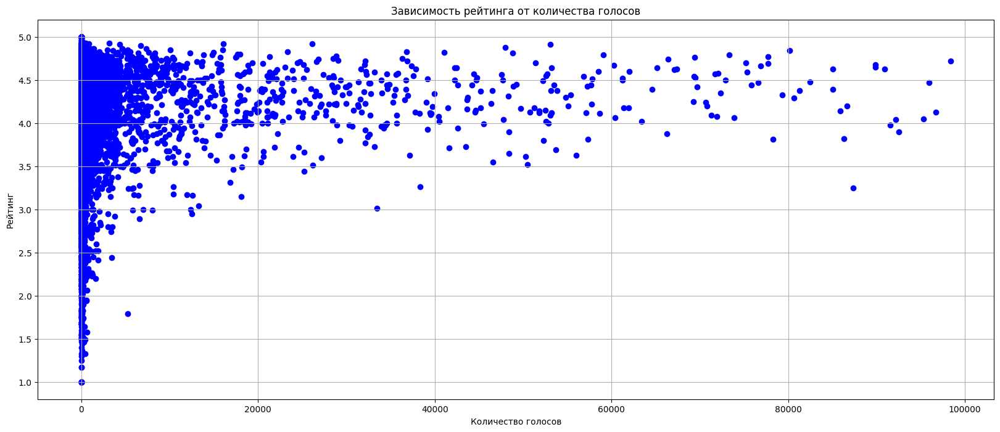

In [327]:
filter_votes = 100000

plt.figure(figsize = (20, 8))
plt.scatter(filtered_df['votes'], filtered_df['rating'], color = 'blue')
plt.title('Зависимость рейтинга от количества голосов')
plt.xlabel('Количество голосов')
plt.ylabel('Рейтинг')
plt.grid(True)
plt.show()

### Зависимость рейтинга от цены

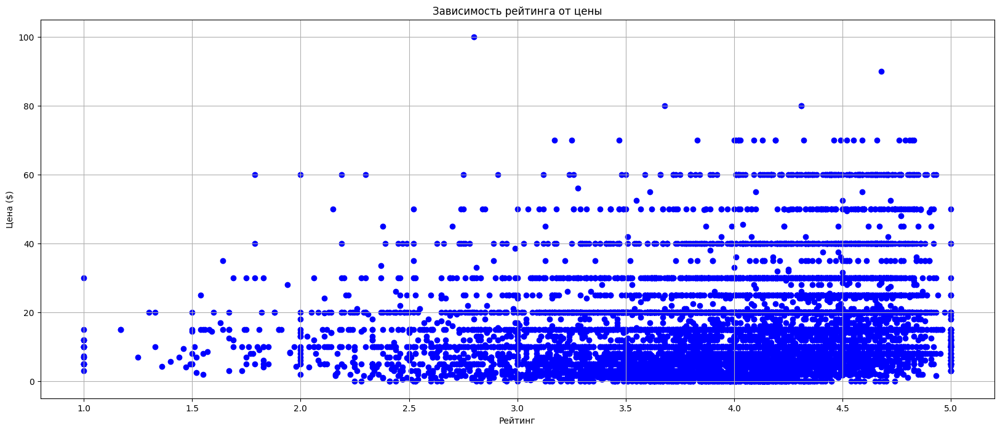

In [328]:
plt.figure(figsize = (20, 8))
plt.scatter(df['rating'], df['price'], color = 'blue')
plt.title('Зависимость рейтинга от цены')
plt.xlabel('Рейтинг')
plt.ylabel('Цена ($)')
plt.grid(True)
plt.show()

### Зависимость рейтинга от даты выхода игры

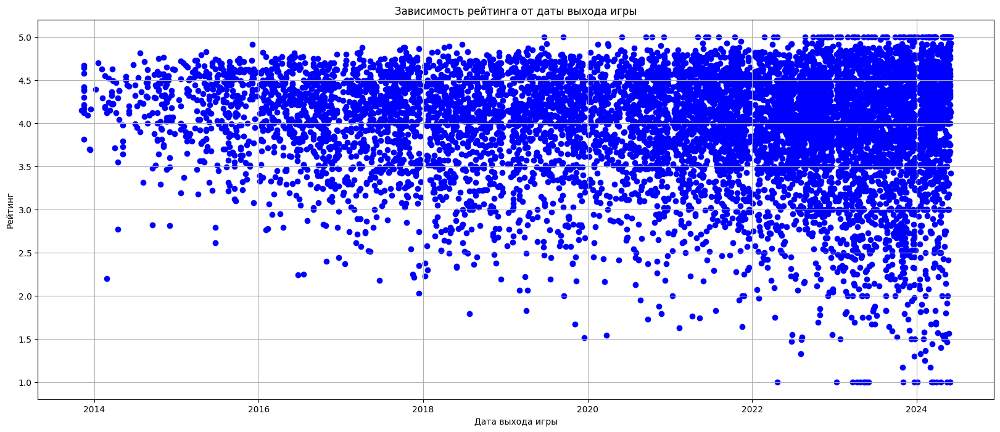

In [329]:
plt.figure(figsize = (20, 8))
plt.scatter(df['release_date'], df['rating'], color = 'blue')
plt.title('Зависимость рейтинга от даты выхода игры')
plt.xlabel('Дата выхода игры')
plt.ylabel('Рейтинг')
plt.grid(True)
plt.show()

### Зависимость рейтинга от жанра

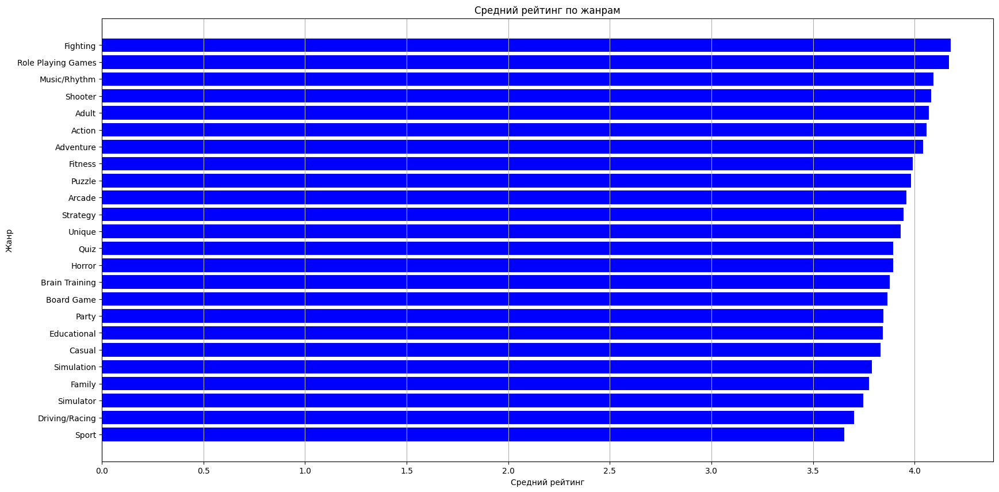

In [330]:
genre_rating = genres_expanded.groupby('genres')['rating'].mean().sort_values()

plt.figure(figsize = (20, 10))
plt.barh(genre_rating.index, genre_rating.values, color = 'blue')
plt.title('Средний рейтинг по жанрам')
plt.xlabel('Средний рейтинг')
plt.ylabel('Жанр')
plt.grid(True, axis = 'x')
plt.show()

### Зависимость рейтинга от платформы

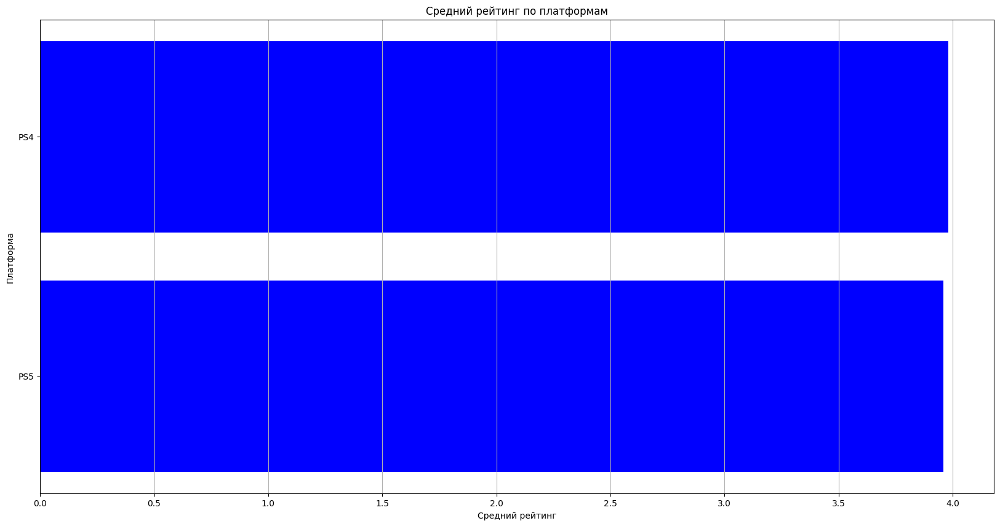

In [331]:
platform_rating = platform_expanded.groupby('platforms')['rating'].mean().sort_values()

plt.figure(figsize = (20, 10))
plt.barh(platform_rating.index, platform_rating.values, color = 'blue')
plt.title('Средний рейтинг по платформам')
plt.xlabel('Средний рейтинг')
plt.ylabel('Платформа')
plt.grid(True, axis = 'x')
plt.show()

### Зависимость рейтинга от разработчика

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 26666 (\N{CJK UNIFIED IDEOGRAPH-682A}) missing from current font.

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 24335 (\N{CJK UNIFIED IDEOGRAPH-5F0F}) missing from current font.

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 20250 (\N{CJK UNIFIED IDEOGRAPH-4F1A}) missing from current font.

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 31038 (\N{CJK UNIFIED IDEOGRAPH-793E}) missing from current font.

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 12498 (\N{KATAKANA LETTER HI}) missing from current font.

/Library/Fram

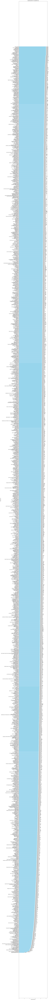

In [332]:
developer_rating = df.groupby('developer').agg({'rating': 'mean', 'votes': 'sum'}).sort_values(
    by = 'rating')

plt.figure(figsize = (10, len(developer_rating) * 0.2))

bars = plt.barh(developer_rating.index, developer_rating['rating'], color = 'skyblue')

for bar, votes in zip(bars, developer_rating['votes']):
    plt.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height() / 2, f'Votes: {votes}',
             va = 'center')

plt.title('Средний рейтинг по разработчику')
plt.xlabel('Средний рейтинг')
plt.ylabel('Разработчик')

plt.show()

Можем заметить, что есть разработчики, которые получили высокий рейтинг, так как за них проголосовали мало людей. Посмотрим на разработчиков, у которых количество голосов больше 100

Так же можно заметить, что при отрисовки графика возникают ошибки. Они связаны с тем, что есть разработчики из Азии, которые в своём названии использую иероглифы

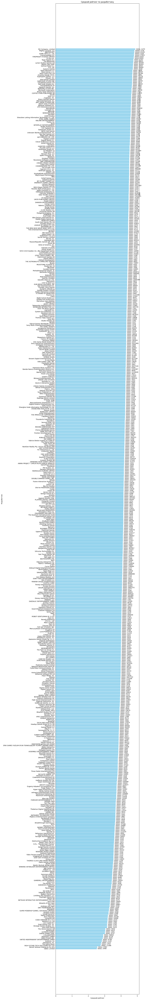

In [333]:
developer_rating_filtered = developer_rating[developer_rating['votes'] >= 1000].sort_values(
    by = 'rating')

plt.figure(figsize = (10, len(developer_rating_filtered) * 0.2))

bars = plt.barh(developer_rating_filtered.index, developer_rating_filtered['rating'],
                color = 'skyblue')

for bar, votes in zip(bars, developer_rating_filtered['votes']):
    plt.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height() / 2, f'Votes: {votes}',
             va = 'center')

plt.title('Средний рейтинг по разработчику')
plt.xlabel('Средний рейтинг')
plt.ylabel('Разработчик')

plt.show()

## Зависимости количества голосов от других переменных

### Зависимость количества голосов от цены

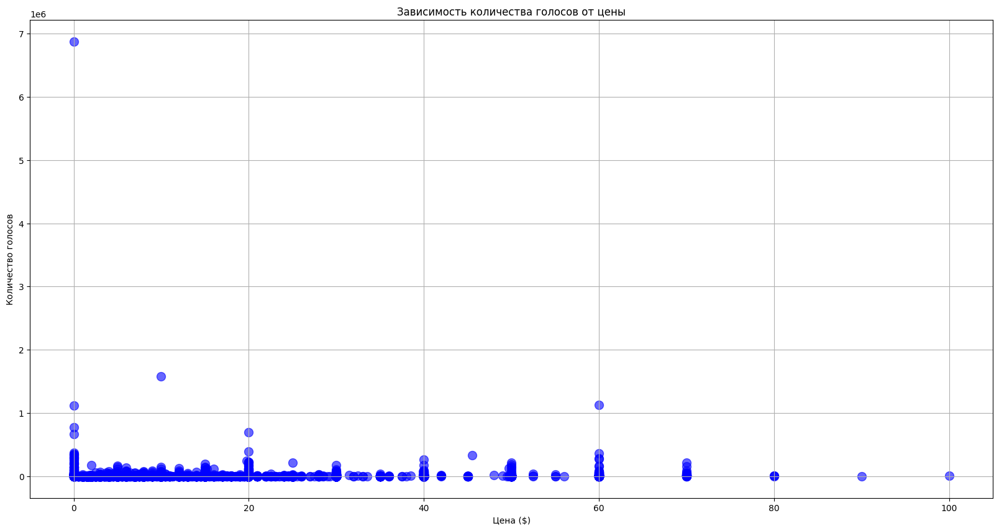

In [334]:
plt.figure(figsize = (20, 10))
plt.scatter(df["price"], df["votes"], color = 'blue', s = 100, alpha = 0.6)
plt.title("Зависимость количества голосов от цены")
plt.xlabel("Цена ($)")
plt.ylabel("Количество голосов")
plt.grid(True)
plt.show()

### Зависимость количества голосов от даты выхода игр

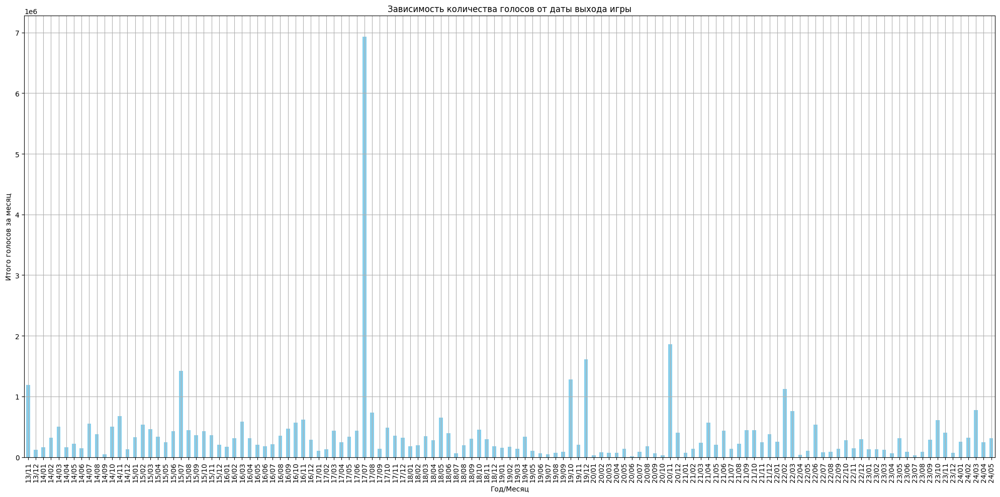

In [335]:
df['release_date'] = pd.to_datetime(df['release_date'])

df['month_year'] = df['release_date'].dt.strftime('%y/%m')
monthly_yearly_votes = df.groupby('month_year')['votes'].sum().sort_index()

plt.figure(figsize = (20, 10))
monthly_yearly_votes.plot(kind = 'bar', color = 'skyblue')
plt.title('Зависимость количества голосов от даты выхода игры')
plt.xlabel('Год/Месяц')
plt.ylabel('Итого голосов за месяц')
plt.grid(True)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

### Зависимость количества голосов от жанра

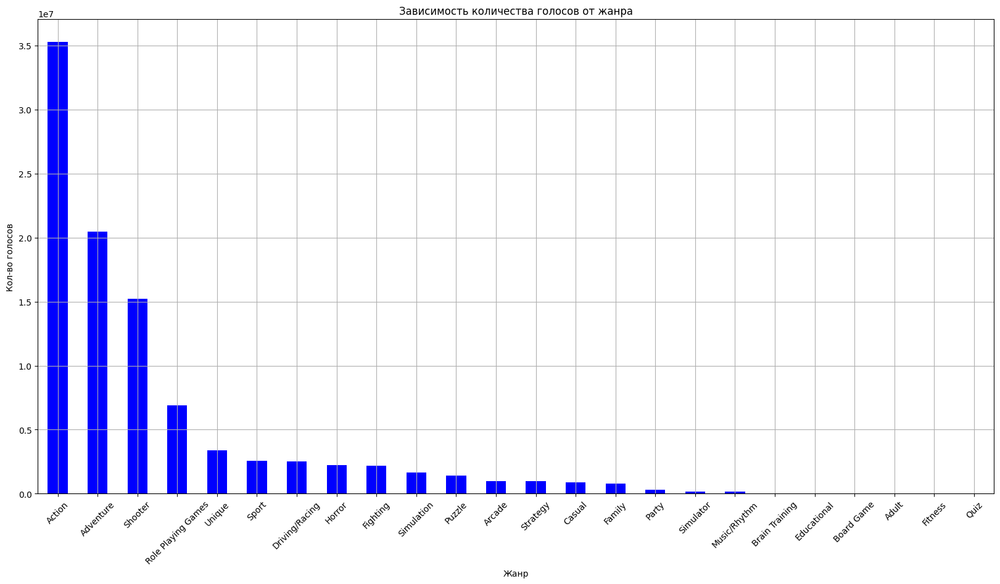

In [336]:
df_expanded = df.explode('genres')

genre_votes = df_expanded.groupby('genres')['votes'].sum().sort_values(ascending = False)

plt.figure(figsize = (20, 10))
genre_votes.plot(kind = 'bar', color = 'blue')
plt.title("Зависимость количества голосов от жанра")
plt.xlabel("Жанр")
plt.ylabel("Кол-во голосов")
plt.xticks(rotation = 45)
plt.grid(True)
plt.show()

### Зависимость количества голосов от платформы

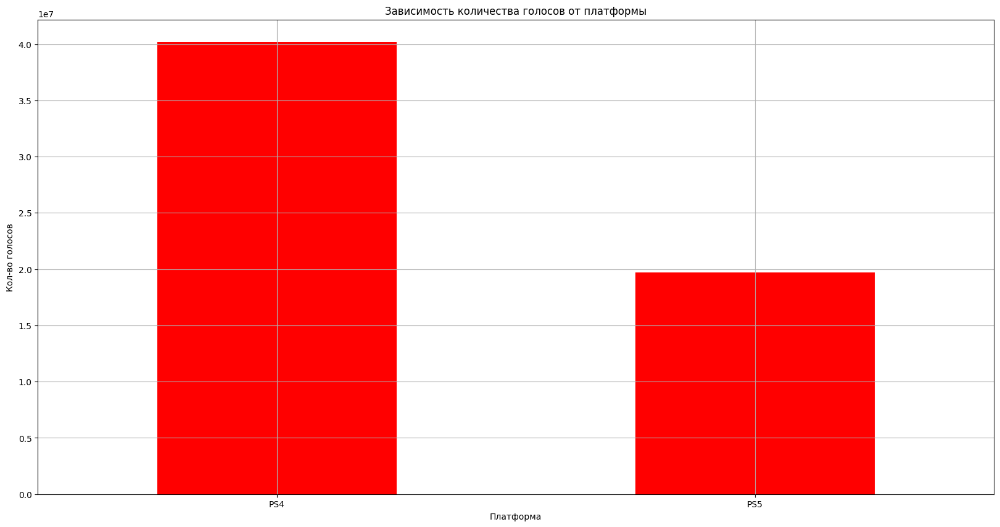

In [337]:
df_expanded_platforms = df.explode('platforms')

platform_votes = df_expanded_platforms.groupby('platforms')['votes'].sum().sort_values(
    ascending = False)

plt.figure(figsize = (20, 10))
platform_votes.plot(kind = 'bar', color = 'red')
plt.title("Зависимость количества голосов от платформы")
plt.xlabel("Платформа")
plt.ylabel("Кол-во голосов")
plt.xticks(rotation = 0)
plt.grid(True)
plt.show()


## Зависимости цены от других переменных

### Зависимость цены от даты выхода игры

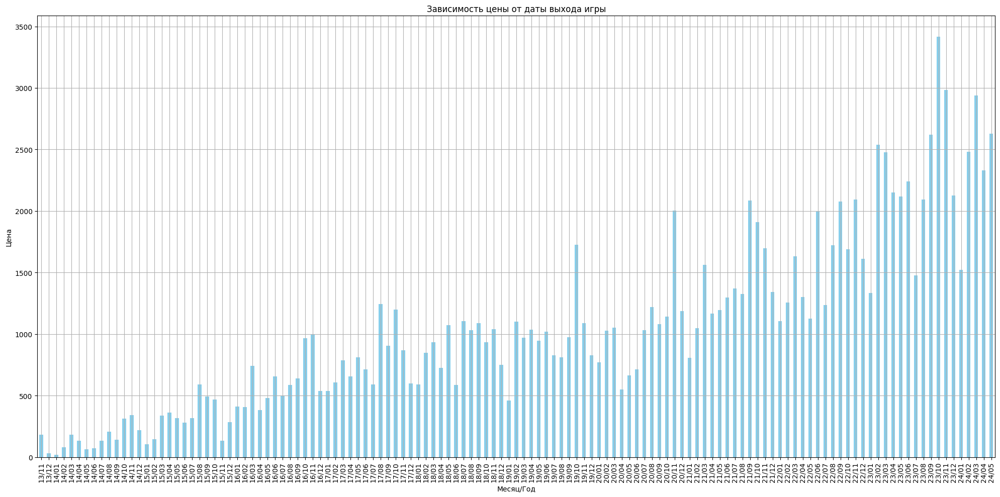

In [338]:
df['release_date'] = pd.to_datetime(df['release_date'])

df['month_year'] = df['release_date'].dt.strftime('%y/%m')
monthly_yearly_votes = df.groupby('month_year')['price'].sum().sort_index()

plt.figure(figsize = (20, 10))
monthly_yearly_votes.plot(kind = 'bar', color = 'skyblue')
plt.title('Зависимость цены от даты выхода игры')
plt.xlabel('Месяц/Год')
plt.ylabel('Цена')
plt.grid(True)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

### Зависимость цены от жанра

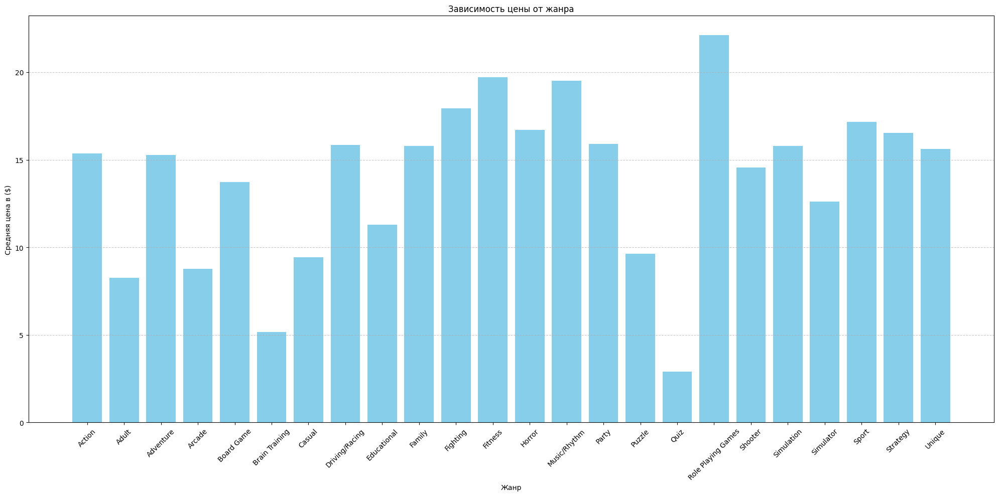

In [339]:
genre_price = genres_expanded.groupby('genres')['price'].mean().reset_index()

plt.figure(figsize = (20, 10))
plt.bar(genre_price['genres'], genre_price['price'], color = 'skyblue')
plt.xlabel('Жанр')
plt.ylabel('Средняя цена в ($)')
plt.title('Зависимость цены от жанра')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Зависимость цены от платформы

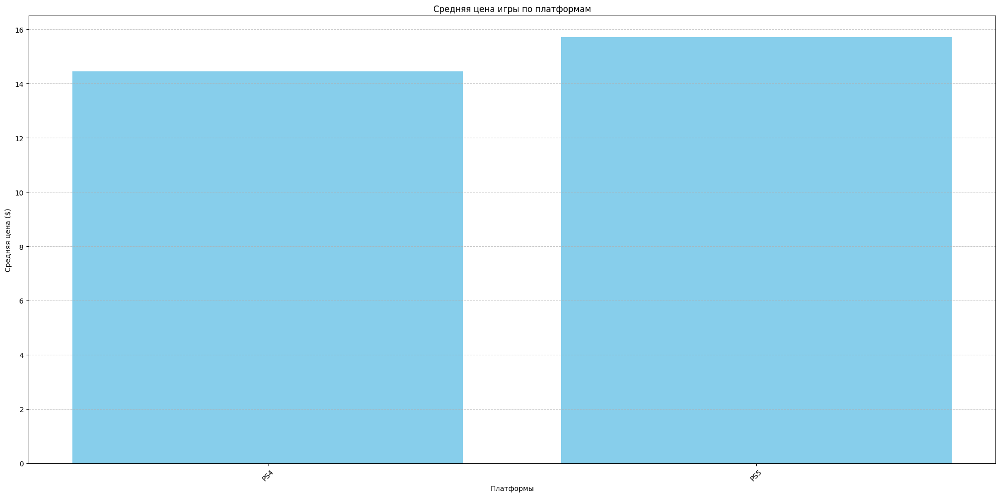

In [340]:
platform_price = platform_expanded.groupby('platforms')['price'].mean().reset_index()

plt.figure(figsize = (20, 10))
plt.bar(platform_price['platforms'], platform_price['price'], color = 'skyblue')
plt.xlabel('Платформы')
plt.ylabel('Средняя цена ($)')
plt.title('Средняя цена игры по платформам')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

## Зависимости дат выхода от других переменных

### Зависимость даты выхода игры от жанра

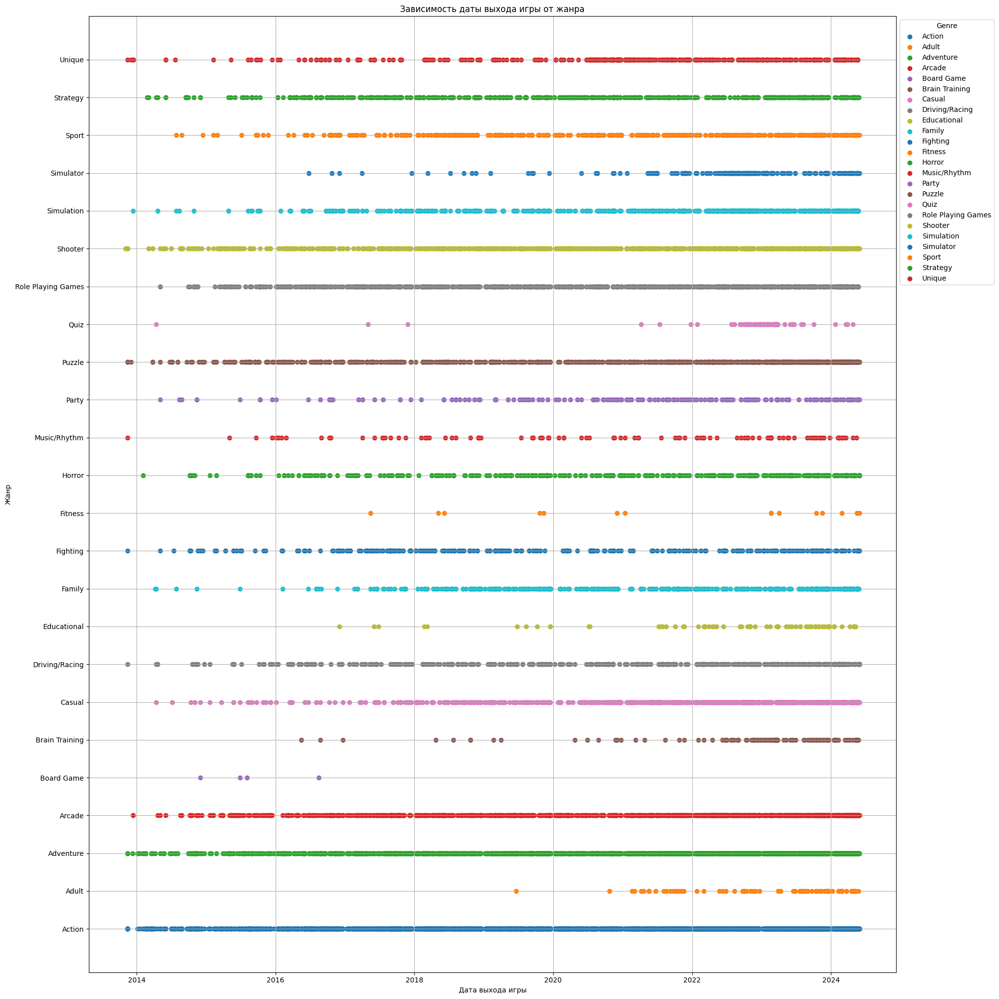

In [341]:
df['release_date'] = pd.to_datetime(df['release_date'])
df_exploded = df.explode('genres')

plt.figure(figsize = (20, 20))
for genre, group in df_exploded.groupby('genres'):
    plt.scatter(group['release_date'], group['genres'], label = genre)

plt.title('Зависимость даты выхода игры от жанра')
plt.xlabel('Дата выхода игры')
plt.ylabel('Жанр')
plt.grid(True)

plt.legend(title = 'Genre', loc = 'upper left', bbox_to_anchor = (1, 1))
plt.tight_layout()
plt.show()

### Зависимость даты выхода игры от платформы

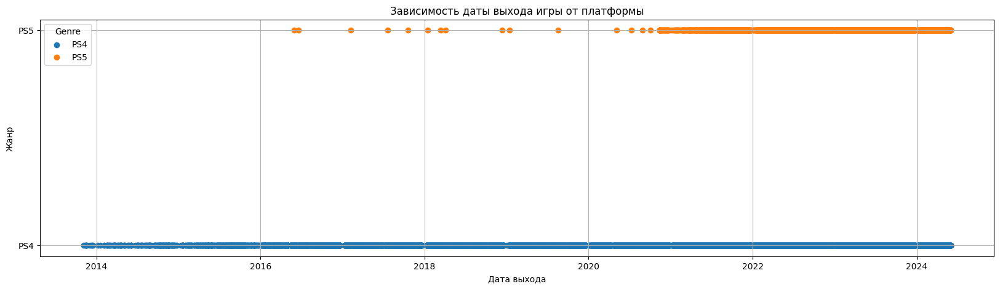

In [342]:
df['release_date'] = pd.to_datetime(df['release_date'])

df_exploded = df.explode('platforms')

plt.figure(figsize = (20, 5))
for genre, group in df_exploded.groupby('platforms'):
    plt.scatter(group['release_date'], group['platforms'], label = genre)

plt.title('Зависимость даты выхода игры от платформы')
plt.xlabel('Дата выхода')
plt.ylabel('Жанр')
plt.legend(title = 'Genre')
plt.grid(True)
plt.show()

## Зависимости жанров от других переменных

### Зависимость жанра от платформы

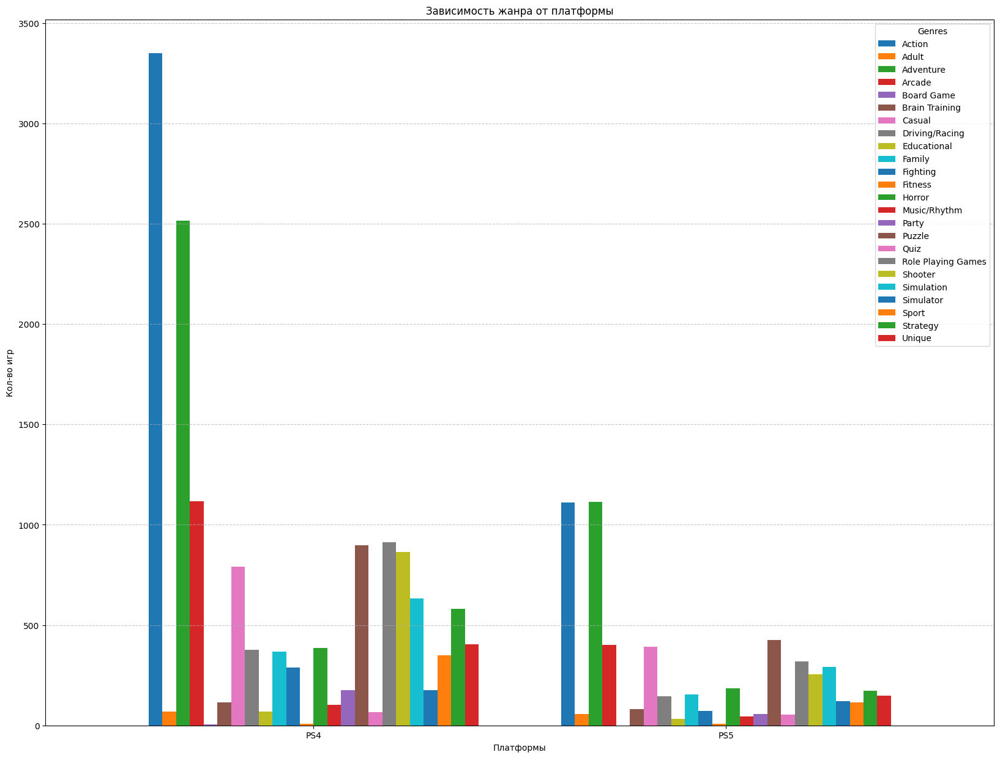

In [343]:
df_expanded = df.explode("platforms").explode("genres")

platform_genre_counts = df_expanded.groupby(['platforms', 'genres']).size().unstack(fill_value = 0)

ax = platform_genre_counts.plot(kind = 'bar', figsize = (20, 15), rot = 0, width = 0.8)
plt.title('Зависимость жанра от платформы')
plt.xlabel('Платформы')
plt.ylabel('Кол-во игр')
plt.legend(title = 'Genres')
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)

plt.show()

# Гипотезы

## Гипотеза 1
Игры определенных жанров имеют статистически значимо разные средние цены

In [344]:
df_expanded = df.explode('genres')

genre_groups = df_expanded.groupby('genres')['price'].apply(list)

anova_result = f_oneway(*genre_groups)

print("F-statistic:", round(anova_result.statistic, 5))
print("p-value:", round(anova_result.pvalue, 5))

if anova_result.pvalue < 0.05:
    print("Средние цены игр значимо различаются в зависимости от жанра.")
else:
    print("Средние цены игр не значимо различаются в зависимости от жанра.")

F-statistic: 58.87643
p-value: 0.0
Средние цены игр значимо различаются в зависимости от жанра.


## Гипотеза 2
Средняя цена игры отличается в зависимости от платформы, для которой игра выпущена

In [345]:
df_expanded = df.explode('platforms')

platform_groups = df_expanded.groupby('platforms')['price'].apply(list)

anova_result = f_oneway(*platform_groups)

print("F-statistic:", round(anova_result.statistic, 5))
print("p-value:", round(anova_result.pvalue, 5))

if anova_result.pvalue < 0.05:
    print("Средние цены игр значимо различаются в зависимости от платформы.")
else:
    print("Средние цены игр не значимо различаются в зависимости от платформы.")

F-statistic: 23.21084
p-value: 0.0
Средние цены игр значимо различаются в зависимости от платформы.


## Гипотеза 3
Существуют определенные временные периоды, в которые выпущенные игры получают больше голосов

In [346]:
df['release_month'] = df['release_date'].dt.month

month_groups = df.groupby('release_month')['votes'].apply(list)

anova_result = f_oneway(*month_groups)

print("F-statistic:", round(anova_result.statistic, 5))
print("p-value:", round(anova_result.pvalue, 5))

if anova_result.pvalue < 0.05:
    print("Количество голосов значимо различается в зависимости от года выпуска.")
else:
    print("Количество голосов не значимо различается в зависимости от года выпуска.")

F-statistic: 1.14023
p-value: 0.32445
Количество голосов не значимо различается в зависимости от года выпуска.


## Гипотеза 4
Игры от определенных разработчиков имеют тенденцию получать более высокие рейтинги

In [347]:
developer_groups = df.groupby('developer')['rating'].apply(list)

anova_result = f_oneway(*developer_groups)

print("F-statistic:", round(anova_result.statistic, 5))
print("p-value:", round(anova_result.pvalue, 5))

if anova_result.pvalue < 0.05:
    print("Средние рейтинги игр значимо различаются в зависимости от разработчика.")
else:
    print("Средние рейтинги игр не значимо различаются в зависимости от разработчика.")

F-statistic: 4.45729
p-value: 0.0
Средние рейтинги игр значимо различаются в зависимости от разработчика.


## Гипотеза 5
Популярность жанров варьируется в зависимости от платформы

In [348]:
df_genres = df.explode('genres')
df_platforms = df_genres.explode('platforms')

contingency_table = pd.crosstab(df_platforms['genres'], df_platforms['platforms'])

chi2, p, dof, expected = chi2_contingency(contingency_table)

print("Chi-squared:", round(chi2, 5))
print("p-value:", round(p, 5))

if p < 0.05:
    print("Популярность жанров значимо различается в зависимости от платформы.")
else:
    print("Популярность жанров не значимо различается в зависимости от платформы.")

Chi-squared: 197.38797
p-value: 0.0
Популярность жанров значимо различается в зависимости от платформы.


## Гипотеза 6
Цена игры влияет на ее рейтинг

In [349]:
correlation, p_value = pearsonr(df['price'], df['rating'])

print("Correlation coefficient:", round(correlation, 5))
print("p-value:", round(p_value, 5))

if p_value < 0.05:
    print("Существует статистически значимая зависимость между ценой и рейтингом игры.")
else:
    print("Не существует статистически значимой зависимости между ценой и рейтингом игры.")

Correlation coefficient: 0.15883
p-value: 0.0
Существует статистически значимая зависимость между ценой и рейтингом игры.


## Гипотеза 7
Существует зависимость между рейтингом игры и количеством голосов

In [350]:
correlation, p_value = pearsonr(df['rating'], df['votes'])

# Вывод результата
print("Correlation coefficient:", round(correlation, 5))
print("p-value:", round(p_value, 5))

# Интерпретация результата
if p_value < 0.05:
    print("Существует статистически значимая зависимость между рейтингом и количеством голосов.")
else:
    print("Не существует статистически значимой зависимости между рейтингом и количеством голосов.")

Correlation coefficient: 0.03399
p-value: 0.00127
Существует статистически значимая зависимость между рейтингом и количеством голосов.


## Гипотеза 8
Существует зависимость между рейтингом игры и датой ее выхода

In [351]:
df['release_date'] = pd.to_datetime(df['release_date'])

start_date = datetime(2000, 1, 1)
df['days_since_start'] = (df['release_date'] - start_date).dt.days

correlation, p_value = pearsonr(df['days_since_start'], df['rating'])

print("Correlation coefficient:", round(correlation, 5))
print("p-value:", round(p_value, 5))

if p_value < 0.05:
    print("Существует статистически значимая зависимость между рейтингом и датой выхода игры.")
else:
    print("Не существует статистически значимой зависимости между рейтингом и датой выхода игры.")

Correlation coefficient: -0.1009
p-value: 0.0
Существует статистически значимая зависимость между рейтингом и датой выхода игры.


# Создание новых признаков

In [352]:
df.index = df['url']

Исходя из данных можно создать следующие признаки:

1) Возраст игры
2) Кол-во жанров у игры

### Возраст игры

Мы уже добавили признак "days_since_start", который показывает, сколько дней прошло с начала 2000 года до даты выхода игры

In [353]:
df

,title,platforms,rating,votes,developer,release_date,price,genres,url,month_year,revenue,release_month,days_since_start
url,,,,,,,,,,,,,
https://store.playstation.com/en-us/concept/10006500,NHL® 24 X-Factor Edition PS5™ & PS4™,"[PS4, PS5]",2.80,3012,Electronic Arts Inc,2023-10-03,99.99,[Sport],https://store.playstation.com/en-us/concept/10...,23/10,301169.88,10,8676
https://store.playstation.com/en-us/concept/10002346,Atelier Mysterious Trilogy Deluxe Pack,[PS4],4.68,462,KOEI TECMO America,2021-04-22,89.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...,21/04,41575.38,4,7782
https://store.playstation.com/en-us/concept/10007151,CRYMACHINA Digital Deluxe Edition,"[PS4, PS5]",4.31,494,NIS America Inc.,2023-10-24,79.99,[Action],https://store.playstation.com/en-us/concept/10...,23/10,39515.06,10,8697
https://store.playstation.com/en-us/concept/227147,Insurgency: Sandstorm - Ultimate Edition [PS4 ...,"[PS4, PS5]",4.31,3750,Focus Entertainment,2024-01-30,79.99,[Unique],https://store.playstation.com/en-us/concept/22...,24/01,299962.50,1,8795
https://store.playstation.com/en-us/concept/10002848,Lords of the Fallen Deluxe Edition,[PS5],3.68,9661,CI Games S.A.,2023-10-13,79.99,"[Role Playing Games, Action]",https://store.playstation.com/en-us/concept/10...,23/10,772783.39,10,8686
...,...,...,...,...,...,...,...,...,...,...,...,...,...
https://store.playstation.com/en-us/concept/10002857,Bunny Raiders,"[PS4, PS5]",3.15,3315,One Earth Rising,2022-01-25,0.00,"[Action, Action]",https://store.playstation.com/en-us/concept/10...,22/01,0.00,1,8060
https://store.playstation.com/en-us/concept/10004405,NARAKA: BLADEPOINT,[PS5],3.33,3275,NETEASE INTERACTIVE ENTERTAINMENT PTE.LTD,2023-07-13,0.00,[Action],https://store.playstation.com/en-us/concept/10...,23/07,0.00,7,8594
https://store.playstation.com/en-us/concept/233550,RPG Maker MV Player,[PS4],3.33,3239,NIS America Inc.,2020-09-08,0.00,[Role Playing Games],https://store.playstation.com/en-us/concept/23...,20/09,0.00,9,7556


### Кол-во жанров у игры

In [354]:
df['genre_count'] = df['genres'].apply(len)
print(f'Среднее кол-во жанров у игр: {round(df["genre_count"].mean(), 2)}')
df

Среднее кол-во жанров у игр: 1.73


,title,platforms,rating,votes,developer,release_date,price,genres,url,month_year,revenue,release_month,days_since_start,genre_count
url,,,,,,,,,,,,,,
https://store.playstation.com/en-us/concept/10006500,NHL® 24 X-Factor Edition PS5™ & PS4™,"[PS4, PS5]",2.80,3012,Electronic Arts Inc,2023-10-03,99.99,[Sport],https://store.playstation.com/en-us/concept/10...,23/10,301169.88,10,8676,1
https://store.playstation.com/en-us/concept/10002346,Atelier Mysterious Trilogy Deluxe Pack,[PS4],4.68,462,KOEI TECMO America,2021-04-22,89.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...,21/04,41575.38,4,7782,1
https://store.playstation.com/en-us/concept/10007151,CRYMACHINA Digital Deluxe Edition,"[PS4, PS5]",4.31,494,NIS America Inc.,2023-10-24,79.99,[Action],https://store.playstation.com/en-us/concept/10...,23/10,39515.06,10,8697,1
https://store.playstation.com/en-us/concept/227147,Insurgency: Sandstorm - Ultimate Edition [PS4 ...,"[PS4, PS5]",4.31,3750,Focus Entertainment,2024-01-30,79.99,[Unique],https://store.playstation.com/en-us/concept/22...,24/01,299962.50,1,8795,1
https://store.playstation.com/en-us/concept/10002848,Lords of the Fallen Deluxe Edition,[PS5],3.68,9661,CI Games S.A.,2023-10-13,79.99,"[Role Playing Games, Action]",https://store.playstation.com/en-us/concept/10...,23/10,772783.39,10,8686,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
https://store.playstation.com/en-us/concept/10002857,Bunny Raiders,"[PS4, PS5]",3.15,3315,One Earth Rising,2022-01-25,0.00,"[Action, Action]",https://store.playstation.com/en-us/concept/10...,22/01,0.00,1,8060,2
https://store.playstation.com/en-us/concept/10004405,NARAKA: BLADEPOINT,[PS5],3.33,3275,NETEASE INTERACTIVE ENTERTAINMENT PTE.LTD,2023-07-13,0.00,[Action],https://store.playstation.com/en-us/concept/10...,23/07,0.00,7,8594,1
https://store.playstation.com/en-us/concept/233550,RPG Maker MV Player,[PS4],3.33,3239,NIS America Inc.,2020-09-08,0.00,[Role Playing Games],https://store.playstation.com/en-us/concept/23...,20/09,0.00,9,7556,1


# Машинное обучение

Самое логичное, что мы могли бы предсказывать – будущий рейтинг игр

In [355]:
df

,title,platforms,rating,votes,developer,release_date,price,genres,url,month_year,revenue,release_month,days_since_start,genre_count
url,,,,,,,,,,,,,,
https://store.playstation.com/en-us/concept/10006500,NHL® 24 X-Factor Edition PS5™ & PS4™,"[PS4, PS5]",2.80,3012,Electronic Arts Inc,2023-10-03,99.99,[Sport],https://store.playstation.com/en-us/concept/10...,23/10,301169.88,10,8676,1
https://store.playstation.com/en-us/concept/10002346,Atelier Mysterious Trilogy Deluxe Pack,[PS4],4.68,462,KOEI TECMO America,2021-04-22,89.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...,21/04,41575.38,4,7782,1
https://store.playstation.com/en-us/concept/10007151,CRYMACHINA Digital Deluxe Edition,"[PS4, PS5]",4.31,494,NIS America Inc.,2023-10-24,79.99,[Action],https://store.playstation.com/en-us/concept/10...,23/10,39515.06,10,8697,1
https://store.playstation.com/en-us/concept/227147,Insurgency: Sandstorm - Ultimate Edition [PS4 ...,"[PS4, PS5]",4.31,3750,Focus Entertainment,2024-01-30,79.99,[Unique],https://store.playstation.com/en-us/concept/22...,24/01,299962.50,1,8795,1
https://store.playstation.com/en-us/concept/10002848,Lords of the Fallen Deluxe Edition,[PS5],3.68,9661,CI Games S.A.,2023-10-13,79.99,"[Role Playing Games, Action]",https://store.playstation.com/en-us/concept/10...,23/10,772783.39,10,8686,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
https://store.playstation.com/en-us/concept/10002857,Bunny Raiders,"[PS4, PS5]",3.15,3315,One Earth Rising,2022-01-25,0.00,"[Action, Action]",https://store.playstation.com/en-us/concept/10...,22/01,0.00,1,8060,2
https://store.playstation.com/en-us/concept/10004405,NARAKA: BLADEPOINT,[PS5],3.33,3275,NETEASE INTERACTIVE ENTERTAINMENT PTE.LTD,2023-07-13,0.00,[Action],https://store.playstation.com/en-us/concept/10...,23/07,0.00,7,8594,1
https://store.playstation.com/en-us/concept/233550,RPG Maker MV Player,[PS4],3.33,3239,NIS America Inc.,2020-09-08,0.00,[Role Playing Games],https://store.playstation.com/en-us/concept/23...,20/09,0.00,9,7556,1


In [356]:
future_games_df

,title,platforms,rating,votes,developer,release_date,price,genres,url
5,EA SPORTS™ College Football 25 Deluxe Edition,[PS5],0.0,0,Electronic Arts Inc,2024-07-15,99.99,[Sport],https://store.playstation.com/en-us/concept/10...
16,Killer Klowns From Outer Space: The Game,[PS5],0.0,0,IllFonic Inc.,2024-05-28,39.99,"[Horror, Action]",https://store.playstation.com/en-us/concept/10...
24,SILENT HILL 2,[PS5],0.0,0,"Konami Digital Entertainment, Inc.",2024-10-08,69.99,[Horror],https://store.playstation.com/en-us/concept/10...
26,EA SPORTS™ Madden NFL 25 Deluxe Edition PS5 & ...,[PS5],0.0,0,Electronic Arts Inc,2024-08-12,99.99,[Sport],https://store.playstation.com/en-us/concept/10...
65,V Rising,[PS5],0.0,0,Stunlock Studios AB,2024-06-11,39.99,[Action],https://store.playstation.com/en-us/concept/10...
78,Assassin’s Creed Shadows,[PS5],0.0,0,Ubisoft Entertainment,2024-11-15,69.99,[Role Playing Games],https://store.playstation.com/en-us/concept/10...
96,Zenless Zone Zero,[PS5],0.0,0,COGNOSPHERE PTE. LTD.,2024-07-04,9.99,"[Action, Role Playing Games]",https://store.playstation.com/en-us/concept/10...
98,"Warhammer 40,000: Space Marine 2",[PS5],0.0,0,Focus Entertainment,2024-09-09,69.99,"[Action, Action]",https://store.playstation.com/en-us/concept/10...
100,Undisputed WBC Edition,[PS5],0.0,0,Deep Silver,2024-10-08,79.99,[Fighting],https://store.playstation.com/en-us/concept/10...
116,Test Drive Unlimited Solar Crown,[PS5],0.0,0,NACON SA,2024-09-12,59.99,[Driving/Racing],https://store.playstation.com/en-us/concept/10...


Для измерения качества модели будем использовать метрику Root Mean Squared Error (RMSE), так как она позволяет оценить среднюю величину ошибки предсказания модели. RMSE чувствительна к большим ошибкам, что важно для точного предсказания рейтинга.

In [357]:
X = df.drop(columns = ['rating', 'url', 'genres', 'platforms'])
y = df['rating']

categorical_cols = ['title', 'developer']
numerical_cols = ['votes', 'price']

numerical_transformer = Pipeline(steps = [
    ('imputer', SimpleImputer(strategy = 'mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps = [
    ('imputer', SimpleImputer(strategy = 'most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown = 'ignore'))
])

preprocessor = ColumnTransformer(
    transformers = [
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state = 0),
    'Random Forest': RandomForestRegressor(random_state = 0),
    'Gradient Boosting': GradientBoostingRegressor(random_state = 0)
}

results = {}

for model_name, model in models.items():
    clf = Pipeline(steps = [('preprocessor', preprocessor),
                            ('classifier', model)])
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    results[model_name] = {
        'MAE': mean_absolute_error(y_test, y_pred),
        'RMSE': np.sqrt(mean_squared_error(y_test, y_pred))
    }

for model_name, metrics in results.items():
    print(f'{model_name}:')
    print(f'MAE: {metrics["MAE"]}')
    print(f'RMSE: {metrics["RMSE"]}')
    print()

Linear Regression:
MAE: 0.40823312146249713
RMSE: 0.5406132165034918

Decision Tree:
MAE: 0.4644963828603228
RMSE: 0.6664939119518591

Random Forest:
MAE: 0.3968959376739009
RMSE: 0.5686666128809158

Gradient Boosting:
MAE: 0.42428479694807275
RMSE: 0.560806778757132



Мы обучили и оценили четыре модели: линейная регрессия, решающее дерево, случайный лес и градиентный бустинг. Лучшие результаты показал градиентный бустинг, так как он имеет наименьшее значение RMSE.

Попробуем улучшить результаты градиентного бустинга, используя GridSearchCV для подбора гиперпараметров

In [360]:
param_grid_reduced = {
    'classifier__n_estimators': range(250, 1001, 250),
    'classifier__learning_rate': list(np.arange(0.01, 0.11, 0.01)) + list(np.arange(0.1, 0.6, 0.1)),
    'classifier__max_depth': range(3, 8)
}

clf = Pipeline(steps = [('preprocessor', preprocessor),
                        ('classifier', GradientBoostingRegressor(random_state = 0))])

grid_search_reduced = GridSearchCV(clf, param_grid_reduced, cv = 3,
                                   scoring = 'neg_mean_squared_error')
grid_search_reduced.fit(X_train, y_train)

best_params_reduced = grid_search_reduced.best_params_
best_model_reduced = grid_search_reduced.best_estimator_

y_pred_reduced = best_model_reduced.predict(X_test)

best_mae_reduced = mean_absolute_error(y_test, y_pred_reduced)
best_rmse_reduced = np.sqrt(mean_squared_error(y_test, y_pred_reduced))

initial_mae = results['Gradient Boosting']['MAE']
initial_rmse = results['Gradient Boosting']['RMSE']

improvement_mae = initial_mae - best_mae_reduced
improvement_rmse = initial_rmse - best_rmse_reduced

for param, value in best_params_reduced.items():
    print(f'{param}: {value}')

print(f'Лучшее MAE: {round(best_mae_reduced, 5)}')
print(f'Лучшее RMSE: {round(best_rmse_reduced, 5)}')

print(f'Улучшения в MAE: {round(improvement_mae, 5)}')
print(f'Улучшения в RMSE: {round(improvement_rmse, 5)}')

classifier__learning_rate: 0.08
classifier__max_depth: 7
classifier__n_estimators: 1000
Лучшее MAE: 0.38361
Лучшее RMSE: 0.52925
Улучшения в MAE: 0.04068
Улучшения в RMSE: 0.03155


Мы провели подбор гиперпараметров для модели градиентного бустинга, используя сеточный поиск (GridSearchCV). Лучшие результаты показала модель с параметрами: n_estimators = 1000, learning_rate = 0.08, max_depth = 7. Эти параметры позволили улучшить RMSE на 0.03155 по сравнению с базовой моделью. И оно составило: 0.52925